## Исследование рынка заведений общественного питания Москвы

**Краткое описание проекта**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Цель проекта**

Подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Описание данных**

Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
                                                                               «Средний счёт: 1000–1500 ₽»;
                                                                               «Цена чашки капучино: 130–220 ₽»;
                                                                               «Цена бокала пива: 400–600 ₽».
                                                                               и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.



### Шаг 1. Открытие файла с данными и изучение общей информации

In [1]:
# импортируем библиотеки для работы с данными
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from plotly import graph_objects as go
import folium
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
data=pd.read_csv('/datasets/moscow_places.csv')# прочитаем csv-файл

In [3]:
data.head(20)# выводим первые 20 строк датафрейма data на экран

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [4]:
data.info()# выводим основную информацию о датафрейме

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


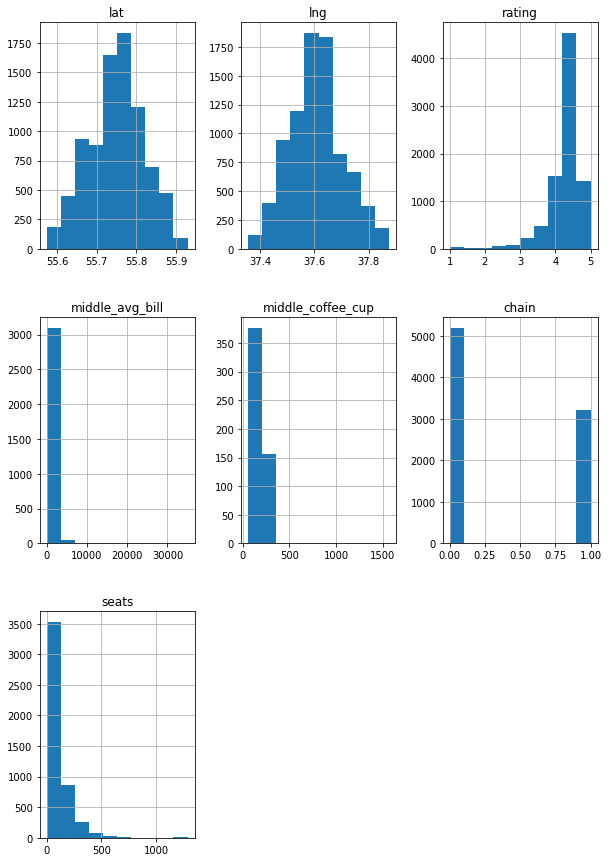

In [5]:
data.hist(figsize=(10,15));# выведем гистограмму по данным

Вывод: Мы получили основную информацию о датафрейме. Датафрейм имеет 8406 строк и 14 столбцов. В нем есть пропущенные значения, которые необходимо будет обработать. В гистограмме данные отображены, с ними все хорошо. Можно приступать к предобработке данных.

### Шаг 2. Предобработка данных

#### Проверим названия колонок

In [6]:
data.columns# посмотрим на названия колонок, чтобы убедиться, нужно ли нам что-то переименовать

Index(['name', 'category', 'address', 'district', 'hours', 'lat', 'lng',
       'rating', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup',
       'chain', 'seats'],
      dtype='object')

С названиями колонок все хорошо, можно исследовать данные дальше

#### Посмотрим на статистические данные столбцов датафрейма

In [7]:
# выведем краткую статистическую сводку для данных:
for row in data:
    display(data[row].describe())

count     8406
unique    5614
top       Кафе
freq       189
Name: name, dtype: object

count     8406
unique       8
top       кафе
freq      2378
Name: category, dtype: object

count                                  8406
unique                                 5753
top       Москва, проспект Вернадского, 86В
freq                                     28
Name: address, dtype: object

count                                   8406
unique                                     9
top       Центральный административный округ
freq                                    2242
Name: district, dtype: object

count                       7870
unique                      1307
top       ежедневно, 10:00–22:00
freq                         759
Name: hours, dtype: object

count    8406.000000
mean       55.750109
std         0.069658
min        55.573942
25%        55.705155
50%        55.753425
75%        55.795041
max        55.928943
Name: lat, dtype: float64

count    8406.000000
mean       37.608570
std         0.098597
min        37.355651
25%        37.538583
50%        37.605246
75%        37.664792
max        37.874466
Name: lng, dtype: float64

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

count        3315
unique          4
top       средние
freq         2117
Name: price, dtype: object

count                         3816
unique                         897
top       Средний счёт:1000–1500 ₽
freq                           241
Name: avg_bill, dtype: object

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

count    8406.000000
mean        0.381275
std         0.485729
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: chain, dtype: float64

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

#### Проверим столбцы на дубликаты и аномальные значения

In [8]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [9]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [10]:
data['lat'].sort_values().unique()

array([55.573942, 55.574039, 55.575511, ..., 55.920426, 55.924367,
       55.928943])

In [11]:
data['lng'].sort_values().unique()

array([37.355651, 37.357339, 37.371261, ..., 37.871974, 37.873787,
       37.874466])

In [12]:
data['rating'].sort_values().unique()

array([1. , 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9, 2. , 2.1, 2.2,
       2.3, 2.4, 2.5, 2.6, 2.7, 2.8, 2.9, 3. , 3.1, 3.2, 3.3, 3.4, 3.5,
       3.6, 3.7, 3.8, 3.9, 4. , 4.1, 4.2, 4.3, 4.4, 4.5, 4.6, 4.7, 4.8,
       4.9, 5. ])

In [13]:
data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [14]:
data['middle_avg_bill'].sort_values().unique()

array([0.000e+00, 3.000e+01, 5.000e+01, 6.700e+01, 9.000e+01, 1.000e+02,
       1.070e+02, 1.100e+02, 1.200e+02, 1.250e+02, 1.300e+02, 1.350e+02,
       1.400e+02, 1.410e+02, 1.500e+02, 1.550e+02, 1.600e+02, 1.650e+02,
       1.670e+02, 1.700e+02, 1.750e+02, 1.800e+02, 1.850e+02, 1.900e+02,
       1.950e+02, 1.990e+02, 2.000e+02, 2.050e+02, 2.090e+02, 2.100e+02,
       2.150e+02, 2.200e+02, 2.250e+02, 2.290e+02, 2.300e+02, 2.350e+02,
       2.400e+02, 2.450e+02, 2.500e+02, 2.550e+02, 2.600e+02, 2.610e+02,
       2.650e+02, 2.660e+02, 2.690e+02, 2.700e+02, 2.750e+02, 2.800e+02,
       2.840e+02, 2.850e+02, 2.900e+02, 2.910e+02, 2.950e+02, 2.980e+02,
       2.990e+02, 3.000e+02, 3.010e+02, 3.040e+02, 3.050e+02, 3.090e+02,
       3.100e+02, 3.130e+02, 3.150e+02, 3.170e+02, 3.200e+02, 3.210e+02,
       3.240e+02, 3.250e+02, 3.280e+02, 3.300e+02, 3.350e+02, 3.390e+02,
       3.400e+02, 3.430e+02, 3.440e+02, 3.450e+02, 3.490e+02, 3.500e+02,
       3.520e+02, 3.550e+02, 3.600e+02, 3.620e+02, 

In [15]:
data.query('middle_avg_bill==0')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3688,Кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,высокие,Средний счёт:от 0 ₽,0.0,NaN,1,200.0


In [16]:
data=data.query('middle_avg_bill!=0')# удалим нулевые значения в столбце middle_avg_bill

In [17]:
data['middle_coffee_cup'].sort_values().unique()

array([  60.,   75.,   79.,   80.,   84.,   89.,   90.,   94.,   95.,
        100.,  102.,  105.,  110.,  112.,  115.,  119.,  120.,  124.,
        125.,  127.,  129.,  130.,  134.,  135.,  137.,  138.,  139.,
        140.,  144.,  145.,  149.,  150.,  154.,  155.,  159.,  160.,
        162.,  164.,  165.,  167.,  169.,  170.,  172.,  174.,  175.,
        179.,  180.,  184.,  185.,  189.,  190.,  195.,  197.,  199.,
        200.,  204.,  205.,  210.,  214.,  215.,  217.,  220.,  225.,
        227.,  229.,  230.,  235.,  237.,  240.,  242.,  245.,  246.,
        250.,  254.,  255.,  256.,  259.,  260.,  265.,  266.,  270.,
        275.,  279.,  285.,  287.,  290.,  291.,  295.,  297.,  300.,
        315.,  320.,  325.,  328.,  375., 1568.,   nan])

In [18]:
data['seats'].sort_values().unique()

array([0.000e+00, 1.000e+00, 2.000e+00, 3.000e+00, 4.000e+00, 5.000e+00,
       6.000e+00, 7.000e+00, 8.000e+00, 9.000e+00, 1.000e+01, 1.200e+01,
       1.300e+01, 1.400e+01, 1.500e+01, 1.600e+01, 1.700e+01, 1.800e+01,
       1.900e+01, 2.000e+01, 2.100e+01, 2.200e+01, 2.400e+01, 2.500e+01,
       2.600e+01, 2.700e+01, 2.800e+01, 2.900e+01, 3.000e+01, 3.200e+01,
       3.300e+01, 3.400e+01, 3.500e+01, 3.600e+01, 3.700e+01, 3.800e+01,
       3.900e+01, 4.000e+01, 4.100e+01, 4.200e+01, 4.300e+01, 4.400e+01,
       4.500e+01, 4.600e+01, 4.700e+01, 4.800e+01, 4.900e+01, 5.000e+01,
       5.100e+01, 5.200e+01, 5.300e+01, 5.400e+01, 5.500e+01, 5.600e+01,
       5.800e+01, 6.000e+01, 6.100e+01, 6.200e+01, 6.300e+01, 6.400e+01,
       6.500e+01, 6.600e+01, 6.700e+01, 6.800e+01, 6.900e+01, 7.000e+01,
       7.200e+01, 7.400e+01, 7.500e+01, 7.600e+01, 7.700e+01, 7.800e+01,
       7.900e+01, 8.000e+01, 8.100e+01, 8.200e+01, 8.300e+01, 8.400e+01,
       8.500e+01, 8.600e+01, 8.700e+01, 8.800e+01, 

In [19]:
data.duplicated().sum()# проверим датафрейм на неявные дубликаты

0

In [20]:
data['name'].duplicated().sum()# посмотрим,сколько дубликатов есть в столбцах

2791

In [21]:
data['name'].value_counts().head(60)

Кафе                                   189
Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Яндекс Лавка                            69
Cofix                                   65
Prime                                   50
Хинкальная                              44
Шаурма                                  43
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
Ресторан                                34
Буханка                                 32
CofeFest                                32
Столовая                                28
Му-Му                                   27
Drive Café                              24
АндерСон                                22
Кофемания                               22
French Bakery                           20
Крошка Карт

Дубликаты в этом столбце связаны с тем, что в городе есть сетевые заведения

In [22]:
data['address'].duplicated().sum()

2653

По одному адресу может быть много различных заведений общепита, ниже это проверим на одном из адресов

In [23]:
data['address'].value_counts().head(10)

Москва, проспект Вернадского, 86В       28
Москва, Усачёва улица, 26               26
Москва, Ярцевская улица, 19             20
Москва, площадь Киевского Вокзала, 2    20
Москва, Лесная улица, 20, стр. 3        16
Москва, Щёлковское шоссе, вл75          16
Москва, проспект Мира, 211к2            16
Москва, Каширское шоссе, 61Г            16
Москва, Пресненская набережная, 2       16
Москва, Хорошёвское шоссе, 27           16
Name: address, dtype: int64

In [24]:
data.query('address=="Москва, проспект Вернадского, 86В"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
6531,Паrk фудхолл,"бар,паб","Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661639,37.480197,4.6,NaN,NaN,NaN,NaN,0,NaN
6532,I Need Doner,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 10:00...",55.661559,37.479887,4.9,NaN,Средний счёт:400–700 ₽,550.0,NaN,1,NaN
6534,Fibo Pasta & Ravioli,кафе,"Москва, проспект Вернадского, 86В",Западный административный округ,пн-сб 10:00–22:00; вс 11:00–22:00,55.661638,37.480148,4.8,средние,Средний счёт:500–1000 ₽,750.0,NaN,1,NaN
6547,Сыроварня,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"ежедневно, 11:00–23:00",55.661718,37.479907,4.5,высокие,Средний счёт:2000–2500 ₽,2250.0,NaN,1,NaN
6549,Bổ,кафе,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661638,37.480148,4.7,NaN,NaN,NaN,NaN,0,NaN
6568,Aly’s Poke,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661776,37.480123,4.6,средние,Средний счёт:390–660 ₽,525.0,NaN,0,NaN
6584,Курица и Утка по-Гонконгски,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"ежедневно, 11:00–23:00",55.661598,37.480319,4.3,NaN,NaN,NaN,NaN,0,NaN
6597,Асса Food,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661783,37.480264,4.3,NaN,NaN,NaN,NaN,0,NaN
6604,Shrimp Kitchen,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.661768,37.480026,4.4,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,NaN
6630,Мясоед,ресторан,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.661762,37.480336,4.2,NaN,NaN,NaN,NaN,0,NaN


Да, действительно, названий по одному адресу несколько

#### Обработаем пропущенные значения в столбцах

In [25]:
data.isna().sum()# выведем количество пропущенных значений для каждого столбца

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7870
chain                   0
seats                3611
dtype: int64

In [26]:
price_null=data[data['price'].isna()]# посмотрим, можно ли убрать пропущенные значения в столбце price
price_null

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
11,Шашлык Шефф,кафе,"Москва, улица Маршала Федоренко, 10с1",Северный административный округ,"ежедневно, 10:00–21:00",55.881770,37.492362,4.9,NaN,NaN,NaN,NaN,0,NaN
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [27]:
price_null.dropna(subset=['middle_avg_bill'])# для этого сделаем срез, убрав строки с пропущеннми значениями в столбце middle_avg_bill

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
27,Шаурму Х@чу,быстрое питание,"Москва, улица Дыбенко, 7, стр. 1",Северный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.879324,37.480280,4.1,NaN,Средний счёт:от 240 ₽,240.0,NaN,0,4.0
32,Додо Пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,NaN,1,46.0
34,Домино'с Пицца,пиццерия,"Москва, Клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,NaN,Средний счёт:от 500 ₽,500.0,NaN,1,247.0
49,2U-Ту-Ю,пиццерия,"Москва, Ижорская улица, 8А",Северный административный округ,"ежедневно, круглосуточно",55.886160,37.508784,2.7,NaN,Средний счёт:900 ₽,900.0,NaN,0,NaN
84,Meat Doner Kebab,булочная,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896987,37.608126,4.5,NaN,Средний счёт:300 ₽,300.0,NaN,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8347,Compass Coffee&Bakery,кафе,"Москва, Окская улица, 1, корп. 1",Юго-Восточный административный округ,"пн-пт 10:00–22:00; сб,вс 11:00–22:00",55.712435,37.752065,4.0,NaN,Средний счёт:300–400 ₽,350.0,NaN,0,80.0
8366,Ситипицца,пиццерия,"Москва, Ферганская улица, 12",Юго-Восточный административный округ,"ежедневно, 10:00–23:00",55.708143,37.808957,4.2,NaN,Средний счёт:300–700 ₽,500.0,NaN,0,4.0
8383,Pizza24/7,пиццерия,"Москва, улица Юных Ленинцев, 10/15к1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.698824,37.738878,4.2,NaN,Средний счёт:150 ₽,150.0,NaN,0,NaN
8399,"Пекарня, кафе-гриль",булочная,"Москва, Болотниковская улица, 52, корп. 2",Юго-Западный административный округ,"ежедневно, круглосуточно",55.662866,37.582572,4.2,NaN,Средний счёт:50–250 ₽,150.0,NaN,0,50.0


In [28]:
# выведем сводную таблицу, которая покажет, какая категория цен соответствует определенному среденему счету и категории заведений
price_pivot=data.pivot_table(index=['category','price'], values='middle_avg_bill', aggfunc='max').sort_values(by=['category','middle_avg_bill'])
price_pivot

middle_avg_bill
category        price                         
бар,паб         низкие                   190.0
                средние                 1250.0
                выше среднего           4500.0
                высокие                11000.0
булочная        низкие                   200.0
                средние                 1000.0
                выше среднего           1250.0
                высокие                 2500.0
быстрое питание низкие                   225.0
                средние                 1100.0
                выше среднего           1500.0
                высокие                 5500.0
кафе            низкие                   600.0
                выше среднего           1700.0
                средние                 1750.0
                высокие                 4500.0
кофейня         низкие                   325.0
                средние                 1100.0
                выше среднего           2000.0
                высокие                 2500.0
пиццерия        низкие                   300.0
                средние                 1250.0
                выше среднего           2000.0
                высокие                 3000.0
ресторан        низкие                   575.0
                средние                 2150.0
                выше среднего           2250.0
                высокие                35000.0
столовая        низкие                   265.0
                средние                 1000.0
                выше среднего           1250.0
                высокие                 3750.0

In [29]:
price_pivot.columns=['max_avg_bill']# переименуем колонку сводной таблицы

In [30]:
price_pivot.reset_index(inplace=True)# сделаем числовой индекс в сводной таблице, убрав предыдущий
price_pivot

,category,price,max_avg_bill
0,"бар,паб",низкие,190.0
1,"бар,паб",средние,1250.0
2,"бар,паб",выше среднего,4500.0
3,"бар,паб",высокие,11000.0
4,булочная,низкие,200.0
5,булочная,средние,1000.0
6,булочная,выше среднего,1250.0
7,булочная,высокие,2500.0
8,быстрое питание,низкие,225.0
9,быстрое питание,средние,1100.0


In [31]:
# напишем функцию, которая выведет категорию колонки price
def get_price (row):
    category=row['category']
    middle_avg_bill=row['middle_avg_bill']
    subcategory=price_pivot[price_pivot['category']==category]['price']

    for subcat in subcategory:
        if middle_avg_bill<float(price_pivot[(price_pivot['category']==category) & (price_pivot['price']==subcat)]['max_avg_bill']):
            row['price']=subcat
            break
    return row

In [32]:
data[data['price'].isna()]=data[data['price'].isna()].apply(get_price, axis=1)# заполним пропущенные значения колонки price

In [33]:
data.isna().sum()# проверим заполнились ли значения колонки price

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                4621
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7870
chain                   0
seats                3611
dtype: int64

#### Добавим новые столбцы в таблицу

In [34]:
# добавим новый столбец street с названием улиц 
def get_street(row):
    try:
        row['street']=row['address'].split(",")[1]
    except:
        pass
        
    return row

In [35]:
data=data.apply(get_street, axis=1)

In [36]:
data['is_24/7']=data['hours'].str.contains('ежедневно, круглосуточно')# добавим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно 

In [37]:
data.head(20)# проверим добавленные столбцы

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,Ижорская улица,False
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица,False
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица,False
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица,False


Вывод: Мы провели предобработку данных. Устранили выбивающиеся значения, избавились от некоторых пропусков, сравнили информацию о датафрейме до очистки и после. Пропусков стало меньше. Остальные пропуски удалить не получится, так как пропадет много данных, которые анализировать будет некорректно, и заменить их чем-то сложно. Также мы добавили новые столбцы. Данные пригодны для дальнейшего анализа.

### Шаг 3. Анализ данных

In [38]:
# получим информацию о статистических характеристиках датасета
for row in data:
    display(data[row].describe())

count     8405
unique    5614
top       Кафе
freq       189
Name: name, dtype: object

count     8405
unique       8
top       кафе
freq      2378
Name: category, dtype: object

count                                  8405
unique                                 5752
top       Москва, проспект Вернадского, 86В
freq                                     28
Name: address, dtype: object

count                                   8405
unique                                     9
top       Центральный административный округ
freq                                    2241
Name: district, dtype: object

count                       7869
unique                      1307
top       ежедневно, 10:00–22:00
freq                         759
Name: hours, dtype: object

count    8405.000000
mean       55.750108
std         0.069662
min        55.573942
25%        55.705155
50%        55.753442
75%        55.795044
max        55.928943
Name: lat, dtype: float64

count    8405.000000
mean       37.608573
std         0.098603
min        37.355651
25%        37.538569
50%        37.605260
75%        37.664793
max        37.874466
Name: lng, dtype: float64

count    8405.000000
mean        4.229863
std         0.470367
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

count        3784
unique          4
top       средние
freq         2382
Name: price, dtype: object

count                         3815
unique                         896
top       Средний счёт:1000–1500 ₽
freq                           241
Name: avg_bill, dtype: object

count     3148.000000
mean       958.358005
std       1009.748800
min         30.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

count    8405.000000
mean        0.381202
std         0.485711
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: chain, dtype: float64

count    4794.000000
mean      108.402587
std       122.839086
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

count               8405
unique              1448
top        проспект Мира
freq                 184
Name: street, dtype: object

count      7869
unique        2
top       False
freq       7140
Name: is_24/7, dtype: object

#### Анализ распределения заведений по категориям

In [39]:
category_df=data['category'].value_counts().to_frame().reset_index()# посмотрим, какие категории заведений представлены в данных

In [40]:
category_df.columns=['category','count']
category_df

,category,count
0,кафе,2378
1,ресторан,2043
2,кофейня,1412
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


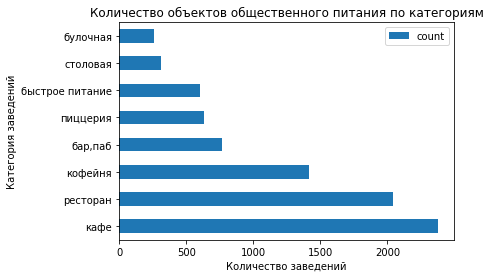

In [41]:
ax=category_df.plot.barh(title= 'Количество объектов общественного питания по категориям', x='category', y='count')
ax.set_ylabel('Категория заведений')
ax.set_xlabel('Количество заведений')
ax.set_title('Количество объектов общественного питания по категориям')
plt.show()

Больше всего из объектов общепита в Москве это: кафе, рестораны и кофейни. Меньше всего столовых и булочных.

#### Исследование количества посадочных мест в местах по категориям

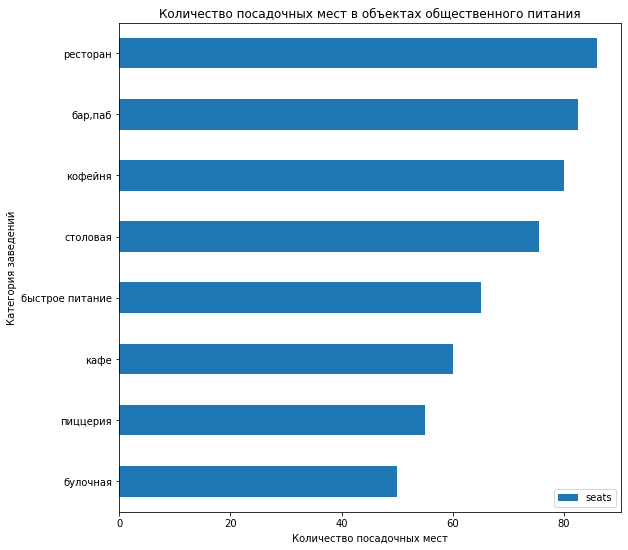

In [42]:
# исследуем количество посадочных мест в местах по категориям
seats_pivot=data.pivot_table(index=['category'], values='seats', aggfunc='median').sort_values(by='seats').plot(y='seats',kind='barh', figsize=(9,9))
seats_pivot.set_ylabel('Категория заведений')
seats_pivot.set_xlabel('Количество посадочных мест')
seats_pivot.set_title('Количество посадочных мест в объектах общественного питания')
plt.show()

На первом месте по количеству посадочных мест стоят рестораны. На втором месте - бары и пабы. На третьем месте - кофейни

#### Соотношение сетевых и несетевых заведений в датасете

In [43]:
my_labels=['Несетевые','Сетевые']

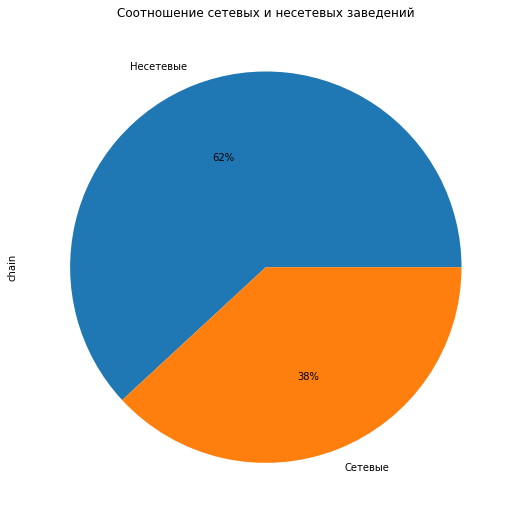

In [44]:
count_chain=data.groupby('chain')['chain'].count().plot(kind='pie', y='chain', autopct='%1.0f%%', figsize=(9,9), title = 'Cоотношение сетевых и несетевых заведений', labels=my_labels)# проверим, каких заведений больше: сетевых или несетевых

Несетевых заведений общепита больше, чем сетевых

#### Нахождение категорий заведений, которые чаще всего являются сетевыми

In [45]:
data_name=data.pivot_table(index='category', values='name', aggfunc='count').reset_index()
data_name

,category,name
0,"бар,паб",765
1,булочная,256
2,быстрое питание,603
3,кафе,2378
4,кофейня,1412
5,пиццерия,633
6,ресторан,2043
7,столовая,315


In [46]:
data_chain=data.query('chain==1').pivot_table(index='category', values='chain', aggfunc='count').reset_index()
data_chain

,category,chain
0,"бар,паб",169
1,булочная,157
2,быстрое питание,232
3,кафе,779
4,кофейня,719
5,пиццерия,330
6,ресторан,730
7,столовая,88


In [47]:
data_chain=data_chain.merge(data_name, on='category', how='left')
data_chain

,category,chain,name
0,"бар,паб",169,765
1,булочная,157,256
2,быстрое питание,232,603
3,кафе,779,2378
4,кофейня,719,1412
5,пиццерия,330,633
6,ресторан,730,2043
7,столовая,88,315


In [48]:
data_chain['percent_chain']=round(data_chain['chain']/data_chain['name']*100,1)
data_chain.sort_values(by='percent_chain')

,category,chain,name,percent_chain
0,"бар,паб",169,765,22.1
7,столовая,88,315,27.9
3,кафе,779,2378,32.8
6,ресторан,730,2043,35.7
2,быстрое питание,232,603,38.5
4,кофейня,719,1412,50.9
5,пиццерия,330,633,52.1
1,булочная,157,256,61.3


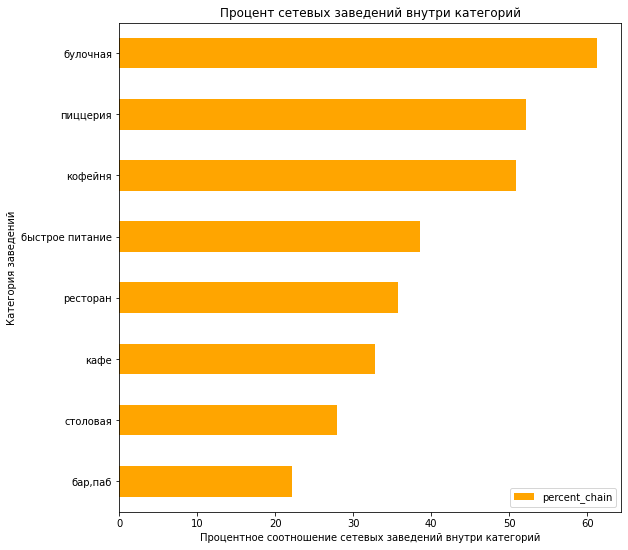

In [49]:
# исследуем, какие категории заведений чаще являются сетевыми
data_chain=data_chain.sort_values(by='percent_chain').plot(y='percent_chain',x='category', kind='barh', figsize=(9,9),color='orange')
data_chain.set_ylabel('Категория заведений')
data_chain.set_xlabel('Процентное соотношение сетевых заведений внутри категорий')
data_chain.set_title('Процент сетевых заведений внутри категорий')
plt.show()

Чаще всего сетевыми являются булочные, пиццерии и кофейни

#### Топ-15 популярных сетей в Москве

In [50]:
pivot=data.pivot_table(index=['name','category'], values='chain', aggfunc='sum').sort_values(by='chain', ascending=False).reset_index().head(15)
pivot

,name,category,chain
0,Шоколадница,кофейня,119
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,49
7,КОФЕПОРТ,кофейня,42
8,Кулинарная лавка братьев Караваевых,кафе,39
9,Теремок,ресторан,36


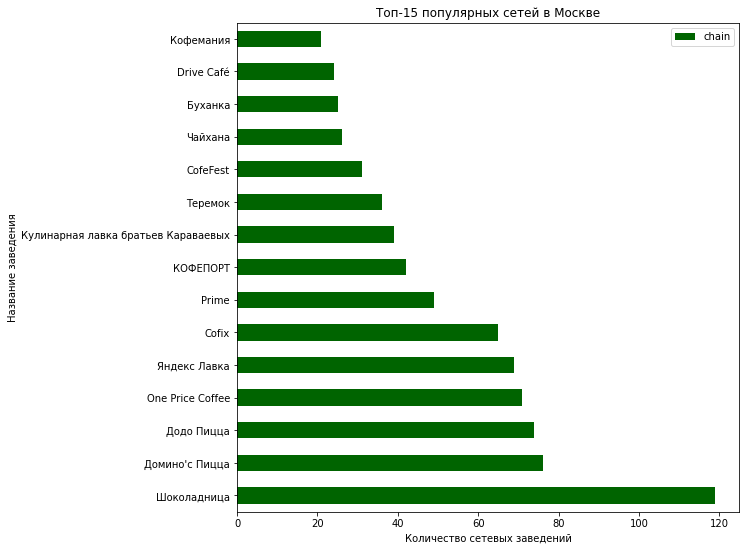

In [51]:
# отобразим эти сети
pivot_1=pivot.plot(y='chain',x='name',kind='barh', figsize=(9,9), color='darkgreen')
pivot_1.set_ylabel('Название заведения')
pivot_1.set_xlabel('Количество сетевых заведений')
pivot_1.set_title('Топ-15 популярных сетей в Москве')
plt.show()

In [52]:
pivot_2=data.query('name in @pivot.name')# сделаем срез датафрейма по названиям сетевых заведений
pivot_2

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
13,Буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,Базовская улица,False
23,Буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN,Лобненская улица,False
24,Drive Café,кафе,"Москва, улица Дыбенко, 9Ас1",Северный административный округ,"ежедневно, круглосуточно",55.879992,37.481571,4.0,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,True
32,Додо Пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,средние,Средний счёт:328 ₽,328.0,NaN,1,46.0,Коровинское шоссе,False
34,Домино'с Пицца,пиццерия,"Москва, Клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,средние,Средний счёт:от 500 ₽,500.0,NaN,1,247.0,Клязьминская улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7968,Яндекс Лавка,ресторан,"Москва, улица Генерала Белова, 28, стр. 4",Южный административный округ,"ежедневно, 07:00–00:00",55.605422,37.723158,3.5,NaN,NaN,NaN,NaN,1,75.0,улица Генерала Белова,False
7973,Теремок,ресторан,"Москва, Ореховый бульвар, 15",Южный административный округ,"ежедневно, 10:00–22:00",55.612758,37.720272,3.7,NaN,NaN,NaN,NaN,1,0.0,Ореховый бульвар,False
7979,Яндекс Лавка,ресторан,"Москва, Шипиловский проезд, 65, корп. 1",Южный административный округ,"ежедневно, 07:00–00:00",55.599020,37.714239,3.5,NaN,NaN,NaN,NaN,1,75.0,Шипиловский проезд,False
7980,Яндекс Лавка,ресторан,"Москва, улица Маршала Захарова, 2",Южный административный округ,"ежедневно, 07:00–00:00",55.624112,37.707183,4.0,NaN,NaN,NaN,NaN,1,200.0,улица Маршала Захарова,False


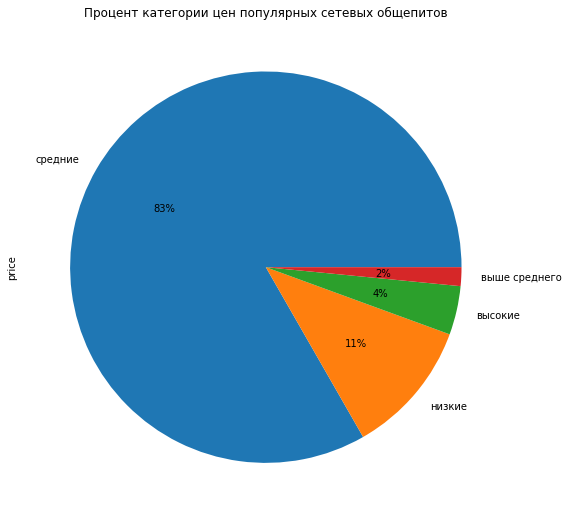

In [53]:
pivot_2['price'].value_counts().plot(kind='pie', y='price', autopct='%1.0f%%', figsize=(9,9), title = 'Процент категории цен популярных сетевых общепитов');

Самая популярная сеть в Москве - Шоколадница (кофейня). Насчитывает 119 заведений по Москве. Эти заведения частично знакомы. Самые популярные сетевые категории заведений это:булочные, пиццерии и кофейни.У сетевых заведений есть то, что их объединяет, чаще всего у них средняя категория цен, составляет это 83% от всех категорий. 

#### Административные районы Москвы. Общее количество заведений и количество заведений каждой категории по районам.

In [54]:
# выведем и информацию о том, какие административные районы Москвы присутствуют в датасете, а также количество заведений каждой категории по районам
data_pivot=data.pivot_table(index=['district'], values='name',columns='category', aggfunc='count')
data_pivot

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,37,62,239,150,71,218,24
Северный административный округ,68,39,58,235,193,77,189,41
Северо-Восточный административный округ,63,28,82,269,159,68,182,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,427,113,670,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Южный административный округ,68,25,85,264,131,73,202,44


In [55]:
# отсортируем сводную таблицу
data_pivot['сумма']=data_pivot.sum(axis=1)
data_pivot=data_pivot.sort_values(by='сумма',ascending=False)
data_pivot=data_pivot.iloc[:,:8]
data_pivot

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Центральный административный округ,364,50,87,464,427,113,670,66
Северный административный округ,68,39,58,235,193,77,189,41
Южный административный округ,68,25,85,264,131,73,202,44
Северо-Восточный административный округ,63,28,82,269,159,68,182,40
Западный административный округ,50,37,62,239,150,71,218,24
Восточный административный округ,53,25,71,272,105,72,160,40
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Северо-Западный административный округ,23,12,30,115,62,40,109,18


In [56]:
data['name'].count()# узнаем общее количество заведений общепита в Москве

8405

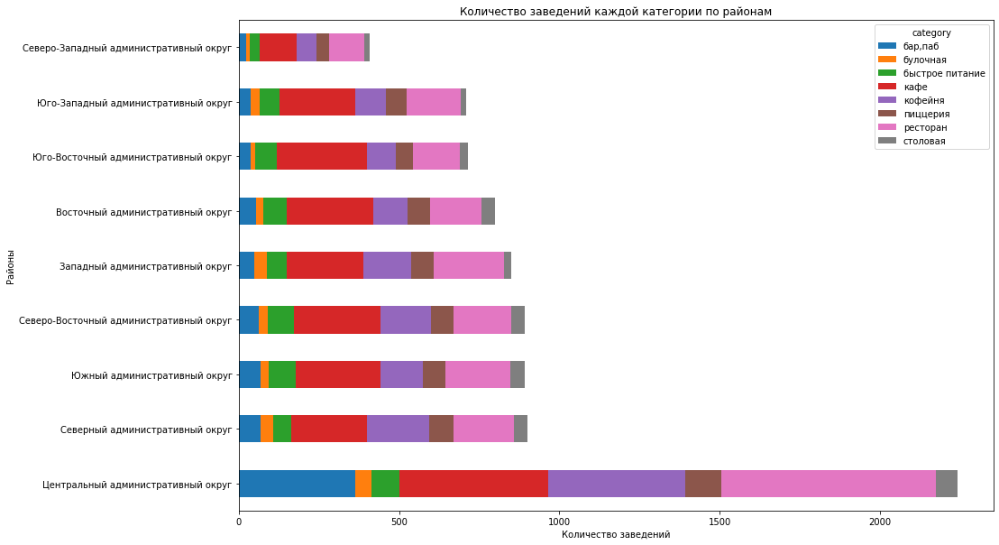

In [57]:
# отобразим общее количество заведений и количество заведений каждой категории по районам
ax = data_pivot.plot.barh(figsize=(15, 10),stacked=True)
ax.set_ylabel('Районы')
ax.set_xlabel('Количество заведений')
ax.set_title('Количество заведений каждой категории по районам')
plt.show()

Административные районы Москвы:
1. Восточный административный округ	
2. Западный административный округ
3. Северный административный округ	
4. Северо-Восточный административный округ	
5. Северо-Западный административный округ	
6. Центральный административный округ	
7. Юго-Восточный административный округ	
8. Юго-Западный административный округ	
9. Южный административный округ	

Выяснилось, что в Центральном административном округе больше всего заведений общепита. Всего заведений общепита - 8405.
Популярные категории в Центральном округе:бары, пабы; кафе, кофейни,рестораны.В Северном, Южном, Северо-Восточном, Западном округах популярны: кафе, кофейни, рестораны. В Восточном, Юго-Восточном, Юго-Западном, Северо-Западном округах популярны: кафе и рестораны.

#### Распределение средних рейтингов по категориям заведений

In [58]:
# посчитаем средний рейтинг по категориям заведений
pivot_rating=data.pivot_table(index=['category'], values='rating', aggfunc='mean').sort_values(by='rating').round(2).reset_index()
pivot_rating

,category,rating
0,быстрое питание,4.05
1,кафе,4.12
2,столовая,4.21
3,булочная,4.27
4,кофейня,4.28
5,ресторан,4.29
6,пиццерия,4.30
7,"бар,паб",4.39


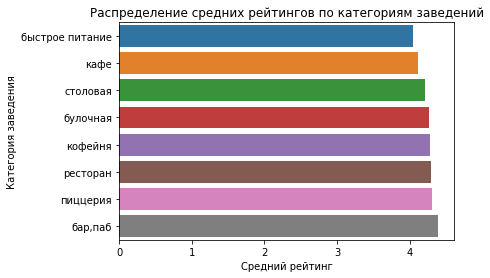

In [59]:
ax=sns.barplot(x='rating',y='category',data=pivot_rating, orient='h')# отобразим этот рейтинг
ax.set_ylabel('Категория заведения')
ax.set_xlabel('Средний рейтинг')
ax.set_title('Распределение средних рейтингов по категориям заведений')
plt.show()

Усреднённые рейтинги в разных типах общепита не сильно различаются, но все же бары  и пабы имеют рейтинг больше, чем остальные, а быстрое питание находится на последнем месте.

#### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [60]:
# выведем средний рейтинг заведений каждого района
mean_rating=data.pivot_table(index=['district'], values='rating', aggfunc='mean').sort_values(by='rating').round(2).reset_index()
mean_rating

,district,rating
0,Юго-Восточный административный округ,4.10
1,Северо-Восточный административный округ,4.15
2,Юго-Западный административный округ,4.17
3,Восточный административный округ,4.17
4,Западный административный округ,4.18
5,Южный административный округ,4.18
6,Северо-Западный административный округ,4.21
7,Северный административный округ,4.24
8,Центральный административный округ,4.38


In [61]:
# откроем файл admin_level_geomap.geojson
with open ('/datasets/admin_level_geomap.geojson') as f:
    geo_json=json.load(f)

In [62]:
state_geo='/datasets/admin_level_geomap.geojson'# загружаем JSON-файл с границами округов Москвы
moscow_lat,moscow_lng=55.751244, 37.618423# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
m=Map(location=[moscow_lat,moscow_lng],zoom_start=10)# создаём карту Москвы

In [63]:
# построим по найденным данным фоновую картограмму и добавим ее на карту
Choropleth(
    geo_data=state_geo,
    data=mean_rating,
    columns=['district','rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Cредний рейтинг заведений каждого района'
).add_to(m)
# выводим карту
m

В Центральном административном округе рейтинг выше всего.

#### Отображение всех заведений датасета на карте с помощью кластеров

In [64]:
marker_cluster=MarkerCluster().add_to(m)# создаём пустой кластер, добавляем его на карту

In [65]:
# напишем функцию, которая принимает строку датафрейма,создаёт маркер с названием заведения и средним рейтингом в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
    [row['lat'], row['lng']],
    popup=f"{row['name']} {row['rating']}",
).add_to(marker_cluster)

In [66]:
data.apply(create_clusters,axis=1)# применяем функцию create_clusters() к каждой строке датафрейма
m# выводим карту

#### Топ-15 улиц по количеству заведений. Распределение количества заведений и их категорий по этим улицам

In [67]:
# найдём топ-15 улиц по количеству заведений
top=data.pivot_table(index=['street'],values='name', aggfunc='count').sort_values('name', ascending=False).head(15).reset_index()
top

,street,name
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


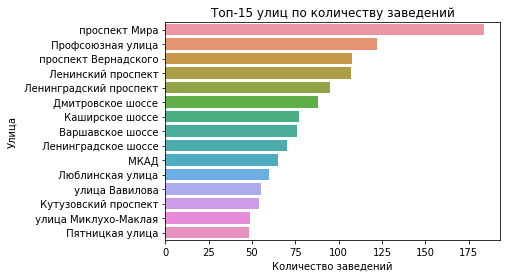

In [68]:
ax=sns.barplot(x='name',y='street',data=top, orient='h')# посмотрим на топ-15 улиц по количеству заведений на графике
ax.set_ylabel('Улица')
ax.set_xlabel('Количество заведений')
ax.set_title('Топ-15 улиц по количеству заведений')
plt.show()

In [69]:
# выведем сводную таблицу количества заведений и их категорий по улицам
top_15=data.query('street in @top.street').pivot_table(index='street',columns='category', values='name', aggfunc='count')
top_15

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0
МКАД,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0


In [70]:
# отсортируем сводную талицу
top_15['сумма']=top_15.sum(axis=1)
top_15=top_15.sort_values(by='сумма',ascending=False)
top_15=top_15.iloc[:,:8]
top_15

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
проспект Мира,12.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0
Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0
проспект Вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0


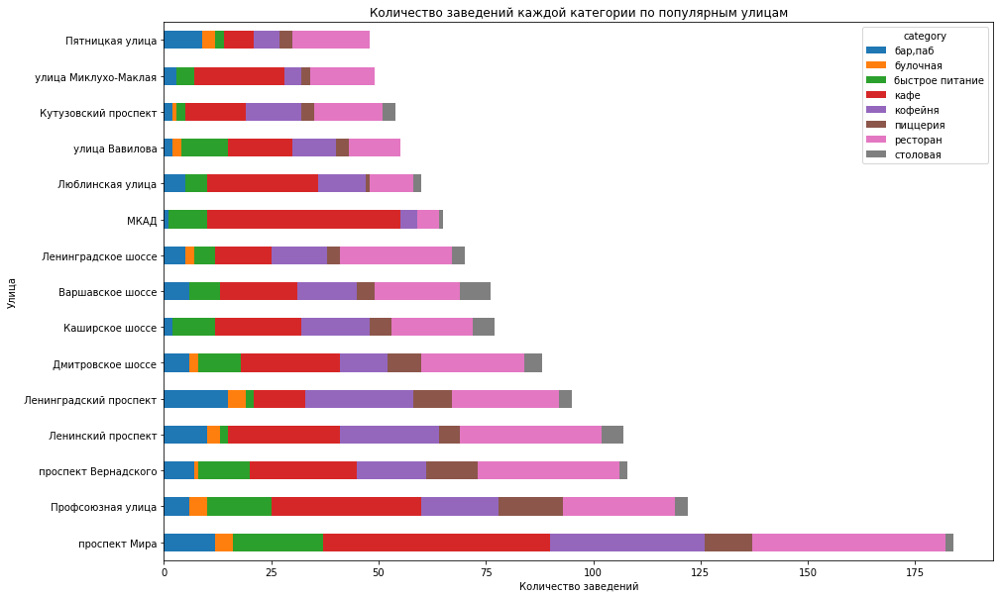

In [71]:
# построим график распределения количества заведений и их категорий по этим улицам
ax = top_15.plot.barh(figsize=(15, 10),stacked=True)
ax.set_ylabel('Улица')
ax.set_xlabel('Количество заведений')
ax.set_title('Количество заведений каждой категории по популярным улицам')
plt.show()

Из топа-15 улиц по количеству заведений первое место заняла улица "Проспект Мира".
На улицах Миклухо-Маклая, МКАД, Люблинской, Каширском и Варшавском шоссе нет булочных. На Профсоюзной улице больше всего пиццерий, а на МКАДе их нет. Бары и пабы есть на всех исследуемых улицах, но на Ленинградском проспекте их больше. На улицах наблюдается большое количество кафе, кофеен, ресторанов. На улицах Пятницкой, Ленинском проспекте, Ленинградском проспекте, Кутузовском проспекте практически нет быстрого питания. На улицах Миклухо-Маклая, Вавилова, Пятницкой нет столовых.

#### Нахождение улиц, на которых находится только один объект общепита

In [72]:
all_name=data.pivot_table(index=['street'],values='name', aggfunc='count').reset_index()# сгруппируем данные по улицам и кол-ву заведений на них

In [73]:
# найдем улицы, на которых находится только один объект общепита
one_name=all_name.query('name==1')
one_name

,street,name
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1436,улица Шкулёва,1
1437,улица Шкулёва 4,1
1439,улица Шухова,1
1442,улица Юннатов,1


In [74]:
# выведем датафрейм с улицами, на которых находится один объект общепита, чтобы посмореть, что общего между этими улицами
one_name_data=data.query('street in @one_name.street')
one_name_data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,Мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица Шкулёва,False
8294,WTFcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица Артюхиной,False
8317,Беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False
8379,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False


Дальше посмотрим по некоторым колонкам 

In [75]:
one_name_data['district'].value_counts()

Центральный административный округ         145
Северо-Восточный административный округ     55
Северный административный округ             52
Восточный административный округ            52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64

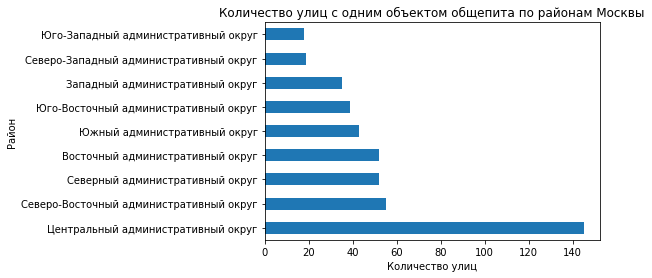

In [76]:
ax=one_name_data['district'].value_counts().plot(kind='barh')
ax.set_ylabel('Район')
ax.set_xlabel('Количество улиц')
ax.set_title('Количество улиц с одним объектом общепита по районам Москвы')
plt.show()

Больше всего улиц с одним объектом общепита находится в Центральном административном округе Москвы

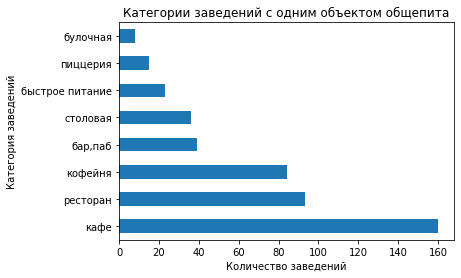

In [77]:
ax=one_name_data['category'].value_counts().plot(kind='barh')
ax.set_ylabel('Категория заведений')
ax.set_xlabel('Количество заведений')
ax.set_title('Категории заведений с одним объектом общепита')
plt.show()

Из категории заведений с одним объектом общепита больше всего это кафе

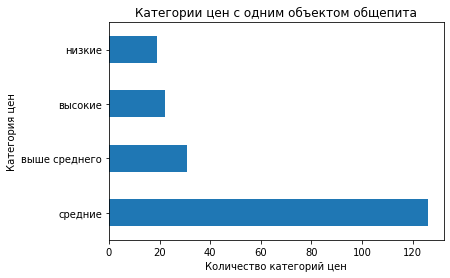

In [78]:
ax=one_name_data['price'].value_counts().plot(kind='barh')
ax.set_ylabel('Категория цен')
ax.set_xlabel('Количество категорий цен')
ax.set_title('Категории цен с одним объектом общепита')
plt.show()

У таких заведений чаще всего средняя категория цен

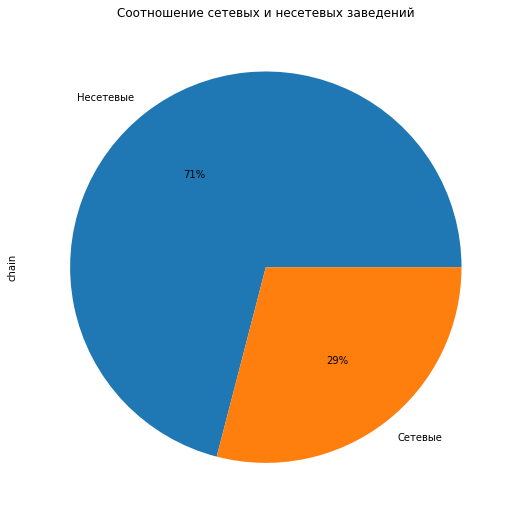

In [79]:
count_chain=one_name_data.groupby('chain')['chain'].count().plot(kind='pie', y='chain', autopct='%1.0f%%', figsize=(9,9), title = 'Cоотношение сетевых и несетевых заведений', labels=my_labels)

Несетевых заведений из них больше всего

458 улиц в Москве с одним объектом общепита. Больше всего улиц с одним объектом общепита находится в Центральном административном округе Москвы. Из категории заведений с одним объектом общепита больше всего это кафе. Несетевых заведений из них больше всего.

#### Медиана значений средних чеков заведений. Анализ цен в центральном административном округе и других

In [80]:
# посчитаем примерную стоимость заказа в рублях для каждого района
pivot_middle_avg_bill=data.pivot_table(index='district', values='middle_avg_bill', aggfunc='median').reset_index()
pivot_middle_avg_bill

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [81]:
# построим хороплет с полученными значениями для каждого района
p=Map(location=[moscow_lat,moscow_lng],zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=pivot_middle_avg_bill,
    columns=['district','middle_avg_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Медианное значение чека для каждого района'
).add_to(p)
p

Цены в заведениях общепита чаще всего уменьшаются при удалении от центра, но в Западном административном округе цены такие же как в Центральном.

Вывод: Мы провели анализ данных и выяснили, что:

1. Больше всего из объектов общепита в Москве это: кафе, рестораны и кофейни. Меньше всего столовых и булочных; 
2. На первом месте по количеству посадочных мест стоят рестораны. На втором месте - бары и пабы. На третьем месте - кофейни;
3. Несетевых заведений общепита больше, чем сетевых. Чаще всего сетевыми являются булочные, пиццерии и кофейни.
4. Самая популярная сеть в Москве - Шоколадница (кофейня). Насчитывает 119 заведений по Москве. Эти заведения частично знакомы. Самые популярные сетевые категории заведений это:булочные, пиццерии и кофейни.У сетевых заведений есть то, что их объединяет, чаще всего у них средняя категория цен, составляет это 83% от цен всех категорий.
5. Административные районы Москвы:

  1) Восточный административный округ	
  2) Западный административный округ
  3) Северный административный округ	
  4) Северо-Восточный административный округ	
  5) Северо-Западный административный округ	
  6) Центральный административный округ	
  7) Юго-Восточный административный округ	
  8) Юго-Западный административный округ	
  9) Южный административный округ	
Выяснилось, что в Центральном административном округе больше всего заведений общепита. Всего заведений общепита - 8405.
Популярные категории в Центральном округе:бары, пабы; кафе, кофейни,рестораны.В Северном, Южном, Северо-Восточном, Западном округах популярны: кафе, кофейни, рестораны. В Восточном, Юго-Восточном, Юго-Западном, Северо-Западном округах популярны: кафе и рестораны.

6. Усреднённые рейтинги в разных типах общепита не сильно различаются (4.10 - 4.38), но все же бары и пабы имеют рейтинг больше, чем остальные, а быстрое питание находится на последнем месте. В Центральном административном округе рейтинг выше всего.
7. Популярные улицы по количеству заведений:

  1) Варшавское шоссе	
  2) Дмитровское шоссе	
  3) Каширское шоссе	
  4) Кутузовский проспект	
  5) Ленинградский проспект	
  6) Ленинградское шоссе	
  7) Ленинский проспект	
  8) Люблинская улица
  9) МКАД	
  10) Профсоюзная улица	
  11) Пятницкая улица
  12) проспект Вернадского	
  13) проспект Мира	
  14) улица Вавилова	
  15) улица Миклухо-Маклая

Из популярных улиц по количеству заведений первое место заняла улица "Проспект Мира". На улицах Миклухо-Маклая, МКАД, Люблинской, Каширском и Варшавском шоссе нет булочных. На Профсоюзной улице больше всего пиццерий, а на МКАДе их нет. Бары и пабы есть на всех исследуемых улицах, но на Ленинградском проспекте их больше. На улицах наблюдается большое количество кафе, кофеен, ресторанов. На улицах Пятницкой, Ленинском проспекте, Ленинградском проспекте, Кутузовском проспекте практически нет быстрого питания. На улицах Миклухо-Маклая, Вавилова, Пятницкой нет столовых.

8. 458 улиц в Москве с одним объектом общепита. Из категории заведений с одним объектом общепита больше всего это кафе. У таких заведений чаще всего средняя категория цен. Несетевых заведений из них больше. Больше всего улиц с одним объектом общепита находится в Центральном административном округе Москвы.
9. Цены в заведениях общепита чаще всего уменьшаются при удалении от центра, но в Западном административном округе цены такие же как в Центральном.



### Шаг 4. Детализируем исследование: открытие кофейни

#### Анализ кофеен в датасете. Расположение кофеен в районах. Распределение рейтингов  кофеен по районам

In [82]:
data.query('category=="кофейня"')['category'].value_counts()# посчитаем, сколько всего кофеен в Москве

кофейня    1412
Name: category, dtype: int64

Всего кофеен в Москве 1412.

In [83]:
data.query('category=="кофейня"').pivot_table(index='district',values='category', aggfunc='count').sort_values(by='category',ascending=False)# посмотрим, как распределяются кофейни по округам

,category
district,
Центральный административный округ,427
Северный административный округ,193
Северо-Восточный административный округ,159
Западный административный округ,150
Южный административный округ,131
Восточный административный округ,105
Юго-Западный административный округ,96
Юго-Восточный административный округ,89
Северо-Западный административный округ,62


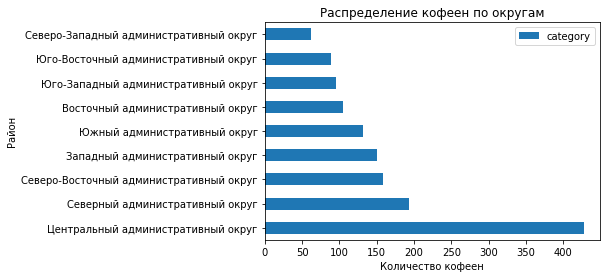

In [84]:
ax=data.query('category=="кофейня"').pivot_table(index='district',values='category', aggfunc='count').sort_values(by='category',ascending=False).plot(kind='barh');# визуализируем распределение
ax.set_ylabel('Район')
ax.set_xlabel('Количество кофеен')
ax.set_title('Распределение кофеен по округам')
plt.show()

Больше всего кофеен в Центральном административном округе. 

In [85]:
# посчитаем средние рейтинги кофеен по округам
cafe=data.query('category=="кофейня"').pivot_table(index='district', values='rating', aggfunc='mean').round(2).reset_index()
cafe

,district,rating
0,Восточный административный округ,4.28
1,Западный административный округ,4.20
2,Северный административный округ,4.29
3,Северо-Восточный административный округ,4.22
4,Северо-Западный административный округ,4.33
5,Центральный административный округ,4.34
6,Юго-Восточный административный округ,4.23
7,Юго-Западный административный округ,4.28
8,Южный административный округ,4.23


In [86]:
# визуализируем средние рейтинги по округам
fig_1=px.line(cafe, y='rating', x='district', title='Средние рейтинги кофеен по округам', labels={'district': 'Район','rating': 'Средний рейтинг'})
fig_1.show()

In [87]:
p=Map(location=[moscow_lat,moscow_lng],zoom_start=10)# также построим хороплет, который покажет разницу рейтингов по округам

In [88]:
Choropleth(
    geo_data=state_geo,
    data=cafe,
    columns=['district','rating'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.45,
    legend_name='Среднее значение рейтинга кофеен для каждого района'
).add_to(p)
p

In [89]:
marker_cluster=MarkerCluster().add_to(p)# добавим кластеры на карту, чтобы была отображена на карте кофейня с названием, рейтингом и ценой чашки капучино

In [90]:
def create_cluster(row):
    Marker(
    [row['lat'], row['lng']],
    popup=f"{row['name']} {row['rating']} {row['middle_coffee_cup']}",
).add_to(marker_cluster)

In [91]:
data.query('category=="кофейня"').apply(create_cluster,axis=1)
p

Располагаются они чаще всего возле метро, остановок, парков, вдоль автомобильной дороги. Средние рейтинги кофеен от 4.20 до 4.34. Выше всего средний рейтинг кофеен в Центральном и Северо-Западном округе. Ниже всего в Северо-Восточном и Западном округе.

#### Количество круглосуточно работающих кофеен

In [92]:
data.query('category=="кофейня"')['is_24/7'].value_counts()# проверим, много ли кофеен работает круглосуточно

False    1339
True       58
Name: is_24/7, dtype: int64

Большинство кофеен не работает круглосуточно.

#### Анализ стоимости чашки капучино при открытии  новой кофейни

In [93]:
# выведем медианную цену чашки капучино по округам
query_coffee=data.query('category=="кофейня"').pivot_table(index='district',values='middle_coffee_cup', aggfunc='median')
query_coffee

,middle_coffee_cup
district,
Восточный административный округ,135.0
Западный административный округ,189.0
Северный административный округ,159.0
Северо-Восточный административный округ,162.5
Северо-Западный административный округ,165.0
Центральный административный округ,190.0
Юго-Восточный административный округ,147.5
Юго-Западный административный округ,198.0
Южный административный округ,150.0


In [94]:
# посмотрим на медианную цену чашки капучино на графике
fig_2=px.line(query_coffee, y='middle_coffee_cup', labels={'district': 'Район','middle_coffee_cup': 'Медианная цена'}, title='Медианная цена чашки капучино по районам')
fig_2.show()

Следует ориентироваться на цену чашки капучино ниже на рублей 10-20 от медианной цены в округе, чтобы была возможность привлечь клиентов ценой ниже.

Всего кофеен в Москве 1412. Больше всего кофеен в Центральном административном округе. Располагаются они чаще всего возле метро, остановок, парков, вдоль автомобильной дороги. Средние рейтинги кофеен от 4.20 до 4.34. Выше всего средний рейтинг кофеен в Центральном и Северо-Западном округе. Ниже всего в Северо-Восточном и Западном округе. Большинство кофеен не работает круглосуточно. Следует ориентироваться на цену чашки капучино ниже на рублей 10-20 от медианной цены в округе, чтобы была возможность привлечь клиентов ценой ниже.

Общий вывод: Мы исследовали рынок заведений общественного питания Москвы. И выяснили, что:

1. Больше всего из объектов общепита в Москве это: кафе, рестораны и кофейни. Меньше всего столовых и булочных; 
2. На первом месте по количеству посадочных мест стоят рестораны. На втором месте - бары и пабы. На третьем месте - кофейни;
3. Несетевых заведений общепита больше, чем сетевых. Чаще всего сетевыми являются булочные, пиццерии и кофейни.
4. Самая популярная сеть в Москве - Шоколадница (кофейня). Насчитывает 119 заведений по Москве. Эти заведения частично знакомы. Самые популярные сетевые категории заведений это:кофейни, пиццерии, кафе, рестораны.У сетевых заведений есть то, что их объединяет, чаще всего у них средняя категория цен, составляет это 83% от всех категорий.
5. Административные районы Москвы:

  1) Восточный административный округ
  2) Западный административный округ
  3) Северный административный округ
  4) Северо-Восточный административный округ
  5) Северо-Западный административный округ
  6) Центральный административный округ
  7) Юго-Восточный административный округ
  8) Юго-Западный административный округ
  9) Южный административный округ
Выяснилось, что в центральном административном округе больше всего заведений общепита. Всего заведений общепита - 8405.
Популярные категории в Центральном округе:бары, пабы; кафе, кофейни,рестораны.В Северном, Южном, Северо-Восточном, Западном округах популярны: кафе, кофейни, рестораны. В Восточном, Юго-Восточном, Юго-Западном, Северо-Западном округах популярны: кафе и рестораны.

6. Усреднённые рейтинги в разных типах общепита не сильно различаются (4.10 - 4.38), но все же бары и пабы имеют рейтинг больше, чем остальные, а быстрое питание находится на последнем месте. В Центральном административном округе рейтинг выше всего.
7. Популярные улицы по количеству заведений:

  1) Варшавское шоссе
  2) Дмитровское шоссе
  3) Каширское шоссе
  4) Кутузовский проспект
  5) Ленинградский проспект
  6) Ленинградское шоссе
  7) Ленинский проспект
  8) Люблинская улица
  9) МКАД
  10) Профсоюзная улица
  11) Пятницкая улица
  12) проспект Вернадского
  13) проспект Мира
  14) улица Вавилова
  15) улица Миклухо-Маклая

Из популярных улиц по количеству заведений первое место заняла улица "Проспект Мира". На улицах Миклухо-Маклая, МКАД, Люблинской, Каширском и Варшавском шоссе нет булочных. На Профсоюзной улице больше всего пиццерий, а на МКАДе их нет. Бары и пабы есть на всех исследуемых улицах, но на Ленинградском проспекте их больше. На улицах наблюдается большое количество кафе, кофеен, ресторанов. На улицах Пятницкой, Ленинском проспекте, Ленинградском проспекте, Кутузовском проспекте практически нет быстрого питания. На улицах Миклухо-Маклая, Вавилова, Пятницкой нет столовых.

8. 458 улиц в Москве с одним объектом общепита. Из категории заведений с одним объектом общепита больше всего это кафе. У таких заведений чаще всего средняя категория цен. Несетевых заведений из них больше. Больше всего улиц с одним объектом общепита находится в Центральном административном округе Москвы.
9. Цены в заведениях общепита чаще всего уменьшаются при удалении от центра, но в Западном административном округе цены такие же как в Центральном.
10. Всего кофеен в Москве 1412. Больше всего кофеен в Центральном административном округе. Располагаются они чаще всего возле метро, остановок, парков, вдоль автомобильной дороги. Средние рейтинги кофеен от 4.20 до 4.34. Выше всего средний рейтинг кофеен в Центральном и Северо-Западном округе. Ниже всего в Северо-Восточном и Западном округе. Большинство кофеен не работает круглосуточно. Следует ориентироваться на цену чашки капучино ниже на рублей 10-20 от медианной цены в округе, чтобы была возможность привлечь клиентов ценой ниже.

Рекомендации: Можно открыть кофейню в тех местах, где чаще всего располагаются кофейни, то есть возле метро, остановок, парков, вдоль автомобильной дороги, в Центральном административном округе неподалеку от установленных кофеен, желательно перед хорошими кофейнями (рейтинг выше 4.0), будет высокая проходимость и поток людей заинтересуется зайти в новую кофейню. Цену лучше установить на рублей 20 ниже за чашку капучино, чем у конкурентов, чтобы это тоже больше привлекло клиентов.

Презентация: <https://disk.yandex.ru/i/BOyuJ6lStjWiDw> 